In [1]:
# Retrieve dataset
# mat file extension

# Grayscale faces 8 bit [0-255], a few images (views) of 20 different people.
# 575 total images, 112x92 size, manually cropped by Daniel Graham at UMist
import scipy.io

source = r'umist_cropped.mat'

umist = scipy.io.loadmat(source)

In [2]:
print(umist.keys())

dict_keys(['__header__', '__version__', '__globals__', 'facedat', 'dirnames'])


In [3]:
faces = umist['facedat']

In [4]:
print(f'faces shape: {faces.shape}, dtype: {faces.dtype}, should be 20 people images')
print(f'faces[0] shape: {faces[0].shape}, dtype: {faces[0].dtype}')
print(f'faces[0][0] shape: {faces[0][0].shape}, dtype: {faces[0][0].dtype}')

faces shape: (1, 20), dtype: object, should be 20 people images
faces[0] shape: (20,), dtype: object
faces[0][0] shape: (112, 92, 38), dtype: uint8


In [17]:
import numpy as np
import matplotlib.pyplot as plt

def separate_images(face_data, num_images, height=112, width=92):
    """
    Separates the combined face data into individual images.
    
    Parameters:
    face_data: numpy array of shape (height, width, num_images)
    height: height of each image (default: 112)
    width: width of each image (default: 92)
    num_images: number of images to extract (default: 38)
    
    Returns:
    List of numpy arrays, each representing a separate image
    """
    # Reshape the data into separate images
    separated_images = []
    
    for img_idx in range(num_images):
        # Extract values for current image
        current_image = np.zeros((height, width))
        
        for i in range(height):
            for j in range(width):
                current_image[i, j] = face_data[i][j][img_idx]
                
        separated_images.append(current_image)
    
    return separated_images

def display_images(images, rows=5, cols=8):
    """
    Display the separated images in a grid.
    
    Parameters:
    images: list of numpy arrays representing images
    rows: number of rows in the display grid
    cols: number of columns in the display grid
    """
    plt.figure(figsize=(20, 12))
    
    for idx, img in enumerate(images):
        if idx >= rows * cols:
            break
            
        plt.subplot(rows, cols, idx + 1)
        plt.imshow(img, cmap='gray')
        plt.axis('off')
        plt.title(f'Image {idx + 1}')
    
    plt.tight_layout()
    plt.show()

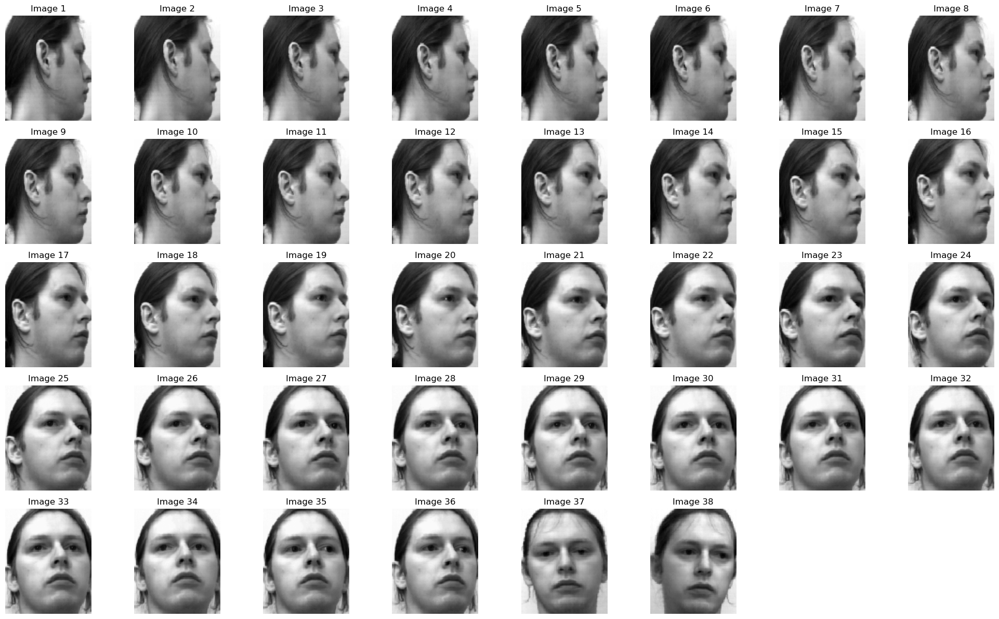

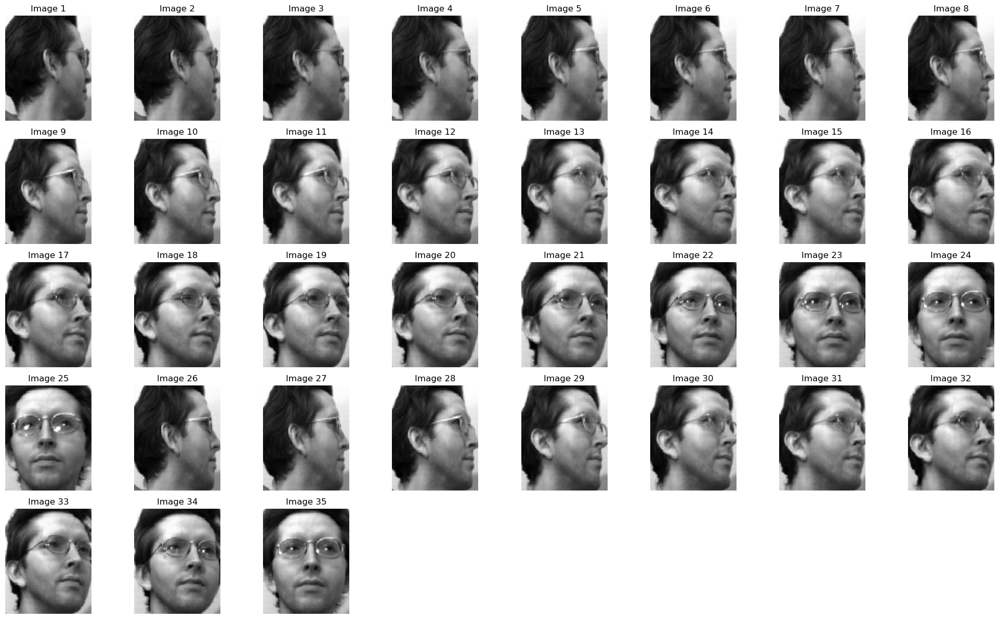

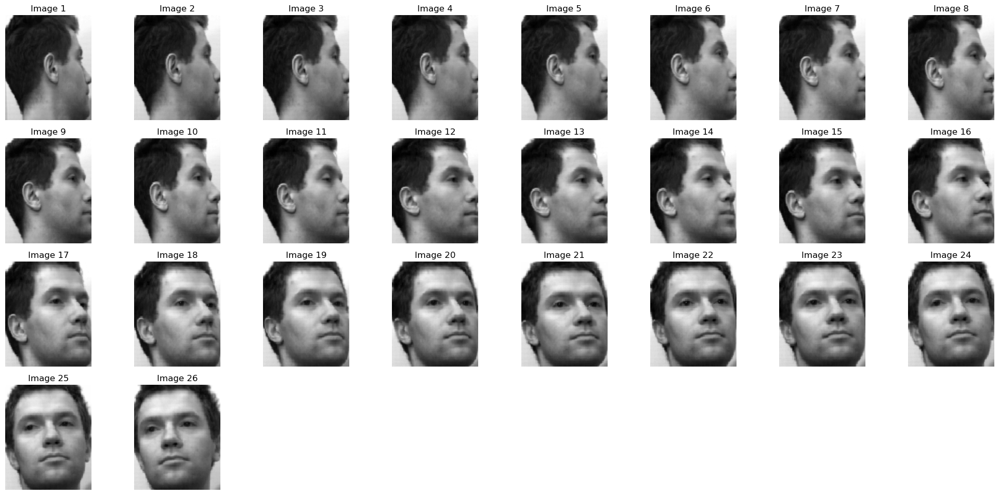

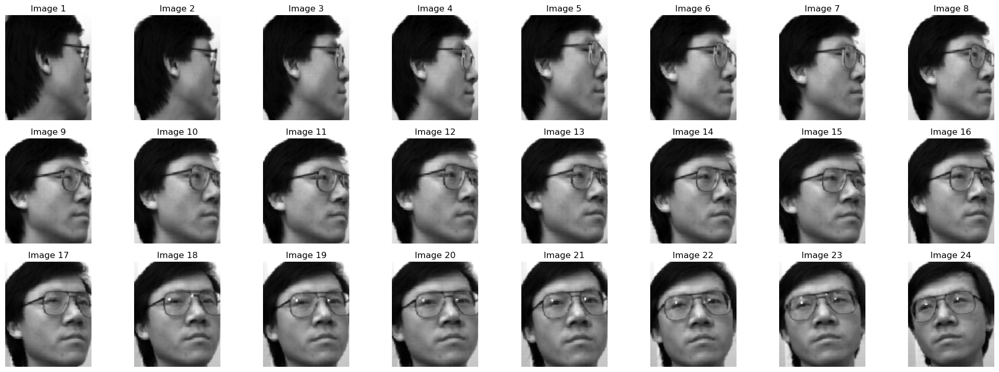

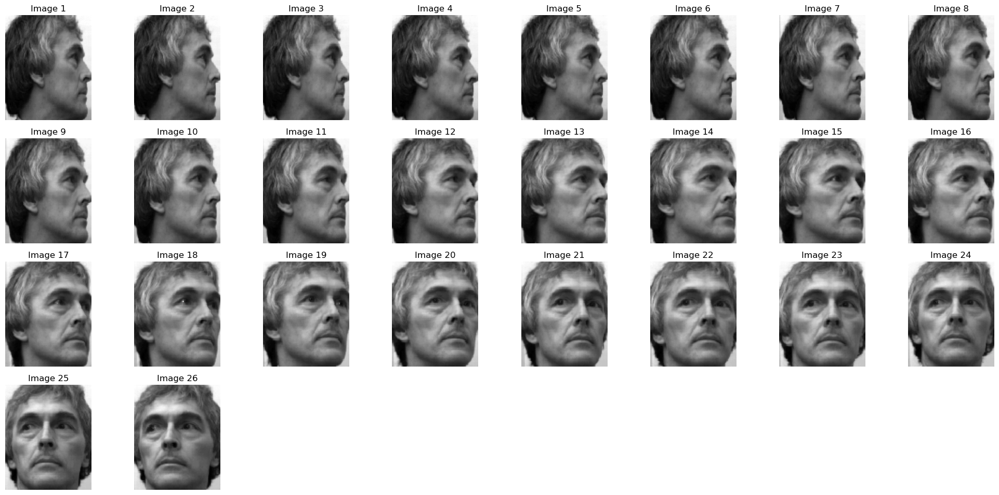

...

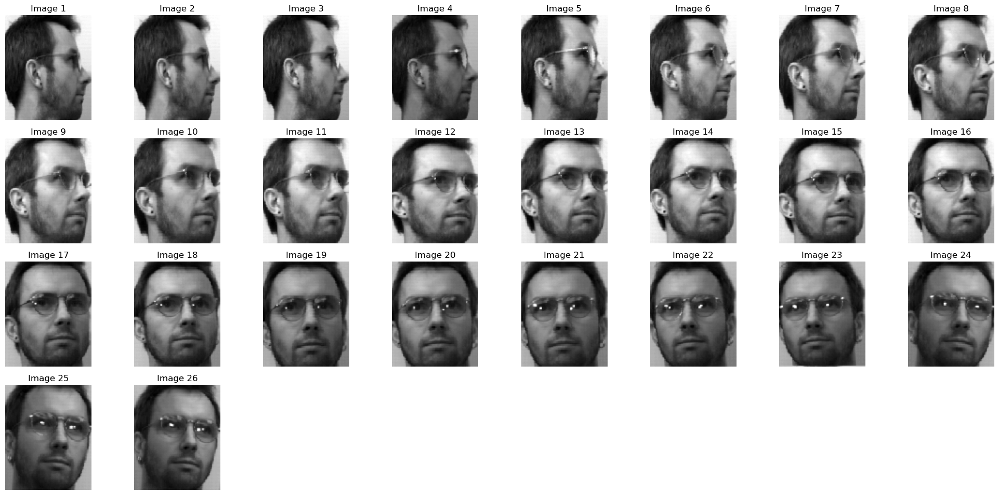

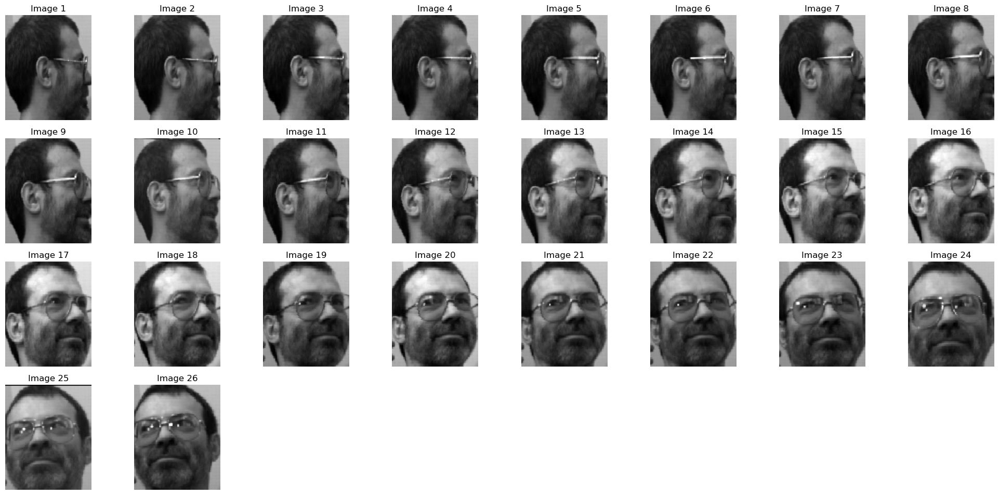

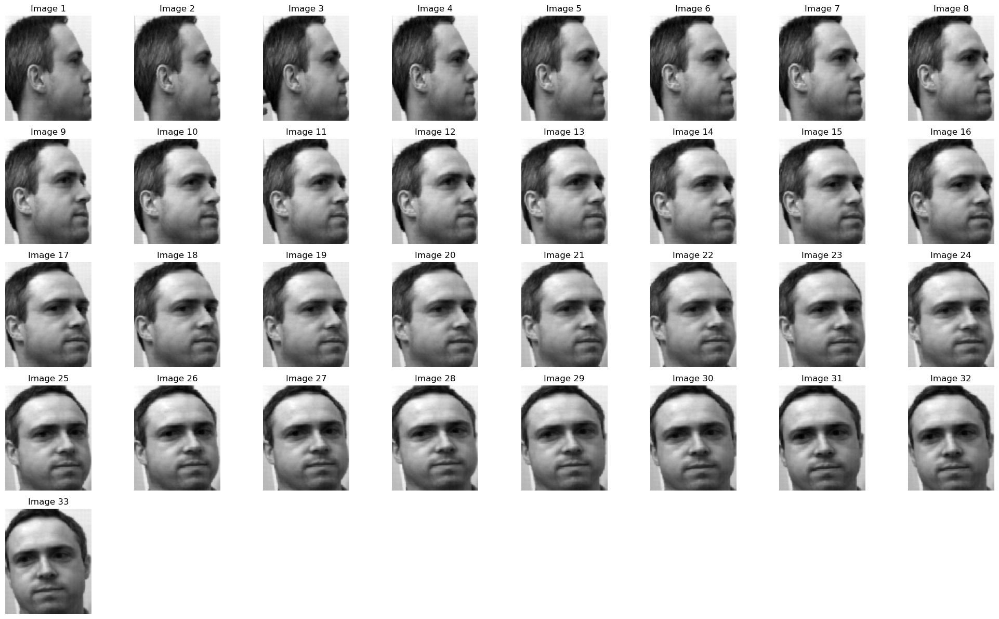

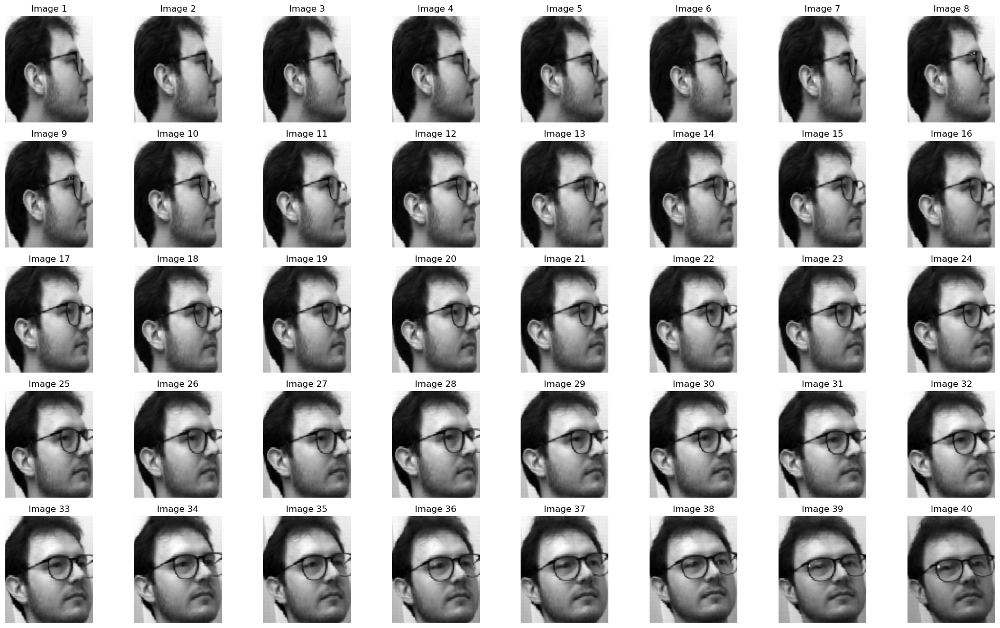

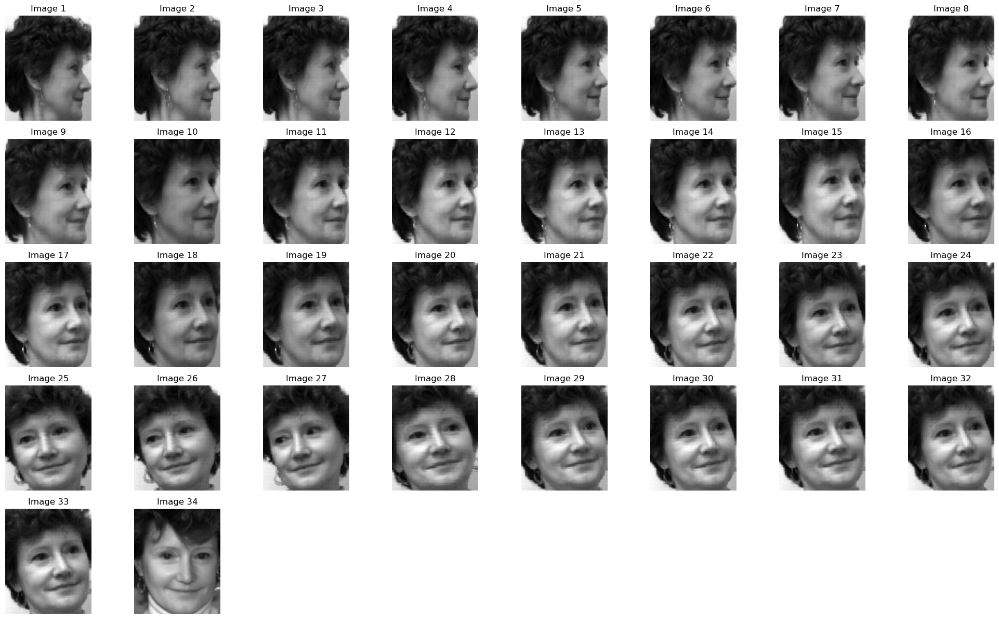

In [21]:
for i in range(0, faces.shape[1]):
    face_data = faces[0][i]  #112 x 92 x 38 data
    separated_images = separate_images(face_data, num_images=face_data.shape[2])
    display_images(separated_images)

In [31]:
dataset = []

for i in range(0, faces.shape[1]):
    face_data = faces[0][i]  #112 x 92 x 38 data
    separated_images = separate_images(face_data, num_images=face_data.shape[2])
    for img in separated_images:
        dataset.append(np.array(img.flatten()))


In [34]:
import pandas as pd
df = pd.DataFrame(np.array(dataset))

In [35]:
#Normalize the data to 0-1
df = df / 255.0

In [37]:
#Establish y labels based on tbhe size of each face set
y = []
for i in range(0, 20):
    for j in range(faces[0][i].shape[2]):
        y.append(i)

In [39]:
X = df
y = pd.DataFrame(y)

In [40]:
# Split the training set, a validation set, and a test set using stratified sampling to ensure that there are the same number of images per person in each set. 
# Provide your rationale for the split ratio.

from sklearn.model_selection import train_test_split

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.4, stratify=y, random_state=58)

X_val, X_test, y_val, y_test = train_test_split(X_test, y_test, test_size=0.5, stratify=y_test, random_state=58)